In [22]:
from PIL import Image, ImageDraw
from io import BytesIO
import json
import joblib
import os
import requests
import random

import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from skimage import feature as skif

import torch
import torchvision
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader, ConcatDataset

random.seed(25)

DATA_PATH = '/data4/imagenet/ILSVRC/Data/CLS-LOC/train/'
FEATURE_PATH = './features_vae/{}.torch'
categories = os.listdir(DATA_PATH)

In [2]:
# Data loader
RGB = {'mean': [0.485, 0.456, 0.406], 'std':[0.229, 0.224, 0.225]}
transforms_train = transforms.Compose([
                    transforms.Resize(135),
                    transforms.CenterCrop(128),
                    transforms.ToTensor(),
                 ])
transforms_val = transforms.Compose([
                    transforms.Resize(135),
                    transforms.CenterCrop(128),
                    transforms.ToTensor(),
                ])

class ImageNetSolo(Dataset):
    def __init__(self, phase, index, data_path):
        super(ImageNetSolo, self).__init__()
        categories = os.listdir(data_path)
        names = os.listdir(os.path.join(data_path, categories[index]))
        self.category = categories[index]
        self.images = [os.path.join(DATA_PATH, categories[index], name) for name in names]
        self.transform = transforms_train if phase == 'train' else transforms_val
    
    def __len__(self):
        return len(self.images)
    
    def __getitem__(self, index):
        path = self.images[index]
        with open(path, 'rb') as f:
            sample = Image.open(f).convert('RGB')
            sample = self.transform(sample)
        return sample, index
    
def get_loader(phase, index, batch_size=256):
    dataset = ImageNetSolo(phase, index, DATA_PATH)
    loader = data.DataLoader(dataset, batch_size=batch_size, shuffle=True if phase == 'train' else False, 
                             pin_memory=True, num_workers=8)
    return loader, dataset

In [3]:
# MMD-VAE Model

class Encoder(nn.Module):
    def __init__(self, num_feat=1024):
        super(Encoder, self).__init__()
        in_channels = 3
        self.conv1 = nn.Conv2d(in_channels, 64 , kernel_size=3, padding=1, stride=2)
        self.bn1 = nn.BatchNorm2d(64)
        self.conv2 = nn.Conv2d(64, 128 , kernel_size=3, padding=1, stride=2) 
        self.bn2 = nn.BatchNorm2d(128)
        self.conv3 = nn.Conv2d(128, 256 , kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm2d(256)
        self.conv4 = nn.Conv2d(256, 256 , kernel_size=3, padding=1, stride=2)
        self.bn4 = nn.BatchNorm2d(256)
        self.conv5 = nn.Conv2d(256, 512 , kernel_size=3, padding=1, stride=2)
        self.bn5 = nn.BatchNorm2d(512)
        self.conv6 = nn.Conv2d(512, 512 , kernel_size=3, padding=1)
        self.bn6 = nn.BatchNorm2d(512)
        self.conv7 = nn.Conv2d(512, 512 , kernel_size=3, padding=1, stride=2)
        self.bn7 = nn.BatchNorm2d(512)
        
        self.fc = nn.Linear(512*4*4, num_feat)
        self.relu = nn.LeakyReLU()
        
    def forward(self, x):
        x = self.relu(self.bn1(self.conv1(x)))  # 64,64,64
        x = self.relu(self.bn2(self.conv2(x)))  # 32,32,128
        x = self.relu(self.bn3(self.conv3(x)))  # 32,32,256
        x = self.relu(self.bn4(self.conv4(x)))  # 16,16,256
        x = self.relu(self.bn5(self.conv5(x)))  # 8,8,512
        x = self.relu(self.bn6(self.conv6(x)))  # 8,8,512
        x = self.relu(self.bn7(self.conv7(x)))  # 4,4,512
        x = self.fc(x.view(x.shape[0], -1))     # 1024
        return x
    
class Decoder(nn.Module):
    def __init__(self, in_feat=1024):
        super(Decoder, self).__init__()
        self.fc1 = nn.Linear(in_feat, in_feat)
        self.fc2 = nn.Linear(in_feat, 512*4*4)
        
        
        self.deconv1 = torch.nn.ConvTranspose2d(512, 256, 4, 2, padding=1)
        self.bn1 = nn.BatchNorm2d(256)
        self.deconv2 = torch.nn.ConvTranspose2d(256, 256, 4, 2, padding=1)
        self.bn2 = nn.BatchNorm2d(256)
        self.conv3 = nn.Conv2d(256, 256 , kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm2d(256)
        self.deconv4 = torch.nn.ConvTranspose2d(256, 256, 4, 2, padding=1)
        self.bn4 = nn.BatchNorm2d(256)
        self.conv5 = nn.Conv2d(256, 128 , kernel_size=3, padding=1)
        self.bn5 = nn.BatchNorm2d(128)
        self.deconv6 = torch.nn.ConvTranspose2d(128, 128, 4, 2, padding=1)
        self.bn6 = nn.BatchNorm2d(128)
        self.conv7 = nn.Conv2d(128, 64 , kernel_size=3, padding=1)
        self.bn7 = nn.BatchNorm2d(64)
        self.deconv8 = torch.nn.ConvTranspose2d(64, 64, 4, 2, padding=1)
        self.bn8 = nn.BatchNorm2d(64)
        self.conv9 = nn.Conv2d(64, 32 , kernel_size=3, padding=1)
        self.bn9 = nn.BatchNorm2d(32)
        self.conv10 = nn.Conv2d(32, 3, kernel_size=3, padding=1)

        self.relu = nn.ReLU()
        self.sigmoid = nn.Sigmoid()
    
    def forward(self, z):
        z = self.relu(self.fc1(z))
        z = self.relu(self.fc2(z)).view(z.shape[0],512,4,4)   
        z = self.relu(self.bn1(self.deconv1(z)))              
        z = self.relu(self.bn2(self.deconv2(z)))              
        z = self.relu(self.bn3(self.conv3(z)))                
        z = self.relu(self.bn4(self.deconv4(z)))              
        z = self.relu(self.bn5(self.conv5(z)))                
        z = self.relu(self.bn6(self.deconv6(z)))
        z = self.relu(self.bn7(self.conv7(z)))  
        z = self.relu(self.bn8(self.deconv8(z))) 
        z = self.relu(self.bn9(self.conv9(z)))  
        z = self.sigmoid(self.conv10(z))                       
        return z


class Model(torch.nn.Module):
    def __init__(self, z_dim):
        super(Model, self).__init__()
        self.encoder = Encoder(z_dim)
        self.decoder = Decoder(z_dim)
        
    def forward(self, x):
        z = self.encoder(x)
        x_reconstructed = self.decoder(z)
        return z, x_reconstructed
    
# calculate MMD loss
def compute_kernel(x, y):
    x_size = x.size(0)
    y_size = y.size(0)
    dim = x.size(1)
    x = x.unsqueeze(1) # (x_size, 1, dim)
    y = y.unsqueeze(0) # (1, y_size, dim)
    tiled_x = x.expand(x_size, y_size, dim)
    tiled_y = y.expand(x_size, y_size, dim)
    kernel_input = (tiled_x - tiled_y).pow(2).mean(2)/float(dim)
    return torch.exp(-kernel_input) # (x_size, y_size)

def compute_mmd(x, y):
    x_kernel = compute_kernel(x, x)
    y_kernel = compute_kernel(y, y)
    xy_kernel = compute_kernel(x, y)
    mmd = x_kernel.mean() + y_kernel.mean() - 2*xy_kernel.mean()
    return mmd

In [4]:
# training model
def training_model(index, batch_size=64, NUM_EPOCH=100, Z_DIM=512):
    train_loader, _ = get_loader(phase='train', index=index, batch_size=batch_size)
    model = Model(Z_DIM).cuda()
    optimizer = torch.optim.Adam([{'params': model.parameters(),}])
    scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, NUM_EPOCH, eta_min=0.0)

    for epoch in range(NUM_EPOCH):
        for i, (images, ids) in enumerate(train_loader):
            optimizer.zero_grad()
            images = images.cuda()
            z_samples = torch.randn(images.shape[0], Z_DIM).to(images.device)
            z, x_reconstructed = model(images)
            mmd = compute_mmd(z_samples, z)
            nll = (x_reconstructed - images).pow(2).mean()
            loss = nll + mmd
            loss.backward()
            optimizer.step()
            if i == 0:
                 print("Epoch is {}, Negative log likelihood is {:.5f}, mmd loss is {:.5f}, Poke LR is {:.5f}".format(epoch,
                    nll.data.item(), mmd.data.item(), float(optimizer.param_groups[0]['lr'])))
        scheduler.step()
    return model

In [5]:
def get_outputs(model, index):
    # show reconstructed image
    org_img = []
    rec_img = []
    indexes = []
    features = []
    out_paths = []
    model.eval()
    val_loader, val_data = get_loader(phase='val', index=index, batch_size=32)
    img_paths = val_data.images
    category = val_data.category
    
    with torch.no_grad():
        for images, ids in val_loader:
            images = images.cuda()
            z, x_reconstructed = model(images)
            org_img.append(images.permute(0,2,3,1).cpu())
            rec_img.append(x_reconstructed.permute(0,2,3,1).cpu())
            indexes.append(ids.view(-1).cpu())
            features.append(z.cpu())
        org_img = torch.cat(org_img, dim=0).numpy()
        rec_img = torch.cat(rec_img, dim=0).numpy()
        indexes = torch.cat(indexes, dim=0).numpy()
        features = torch.cat(features, dim=0).numpy()
    
    for idx in list(indexes):
        out_paths.append(img_paths[idx])
    return org_img, rec_img, features, out_paths, category

In [6]:
def get_cluster_label(features, category, out_paths, output_dict, NUM_CLUSTER=5):
    output_dict[category] = {}
    kmeans = KMeans(n_clusters=NUM_CLUSTER).fit(features)
    for path, label in zip(out_paths, list(kmeans.labels_)):
        if label in output_dict[category]:
            output_dict[category][label].append(path)
        else:
            output_dict[category][label] = [path,]
    return output_dict

In [7]:
# training model from the scratch, then clustering images
output_dict = {}
for index in range(len(categories)):
    print('======== Leanring {} category ==========='.format(index))
    model = training_model(index)
    org_img, rec_img, features, out_paths, category = get_outputs(model, index)
    output_dict = get_cluster_label(features, category, out_paths, output_dict, NUM_CLUSTER=5)
    # save features and image paths
    torch.save({'features':features, 'paths':out_paths}, FEATURE_PATH.format(category))
torch.save(output_dict, FEATURE_PATH.format('clustering_outputs'))

======== Leanring 0 category ===========
Epoch is 0, Negative log likelihood is 0.09254, mmd loss is 0.00031, Poke LR is 0.00100
Epoch is 1, Negative log likelihood is 0.07751, mmd loss is 0.00039, Poke LR is 0.00100
Epoch is 2, Negative log likelihood is 0.06861, mmd loss is 0.00060, Poke LR is 0.00100
Epoch is 3, Negative log likelihood is 0.05013, mmd loss is 0.00102, Poke LR is 0.00100
Epoch is 4, Negative log likelihood is 0.04305, mmd loss is 0.00069, Poke LR is 0.00100
Epoch is 5, Negative log likelihood is 0.03863, mmd loss is 0.00107, Poke LR is 0.00099
Epoch is 6, Negative log likelihood is 0.03926, mmd loss is 0.00116, Poke LR is 0.00099
Epoch is 7, Negative log likelihood is 0.03745, mmd loss is 0.00040, Poke LR is 0.00099
Epoch is 8, Negative log likelihood is 0.03607, mmd loss is 0.00061, Poke LR is 0.00098
Epoch is 9, Negative log likelihood is 0.03408, mmd loss is 0.00036, Poke LR is 0.00098
Epoch is 10, Negative log likelihood is 0.03610, mmd loss is 0.00042, Poke LR i

/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 0, Negative log likelihood is 0.10758, mmd loss is 0.00030, Poke LR is 0.00100


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 1, Negative log likelihood is 0.08486, mmd loss is 0.00033, Poke LR is 0.00100


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 2, Negative log likelihood is 0.07127, mmd loss is 0.00096, Poke LR is 0.00100


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 3, Negative log likelihood is 0.05770, mmd loss is 0.00196, Poke LR is 0.00100


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 4, Negative log likelihood is 0.05477, mmd loss is 0.00106, Poke LR is 0.00100


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 5, Negative log likelihood is 0.04672, mmd loss is 0.00102, Poke LR is 0.00099


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 6, Negative log likelihood is 0.04669, mmd loss is 0.00093, Poke LR is 0.00099


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 7, Negative log likelihood is 0.04382, mmd loss is 0.00082, Poke LR is 0.00099


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 8, Negative log likelihood is 0.04032, mmd loss is 0.00097, Poke LR is 0.00098


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 9, Negative log likelihood is 0.04169, mmd loss is 0.00088, Poke LR is 0.00098


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 10, Negative log likelihood is 0.03957, mmd loss is 0.00049, Poke LR is 0.00098
Epoch is 11, Negative log likelihood is 0.03889, mmd loss is 0.00048, Poke LR is 0.00097


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 12, Negative log likelihood is 0.03670, mmd loss is 0.00052, Poke LR is 0.00096


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 13, Negative log likelihood is 0.03457, mmd loss is 0.00048, Poke LR is 0.00096


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 14, Negative log likelihood is 0.03391, mmd loss is 0.00052, Poke LR is 0.00095
Epoch is 15, Negative log likelihood is 0.03656, mmd loss is 0.00046, Poke LR is 0.00095


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 16, Negative log likelihood is 0.03169, mmd loss is 0.00043, Poke LR is 0.00094


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 17, Negative log likelihood is 0.03202, mmd loss is 0.00072, Poke LR is 0.00093


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 18, Negative log likelihood is 0.03461, mmd loss is 0.00047, Poke LR is 0.00092


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 19, Negative log likelihood is 0.02839, mmd loss is 0.00040, Poke LR is 0.00091


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 20, Negative log likelihood is 0.02896, mmd loss is 0.00031, Poke LR is 0.00090


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 21, Negative log likelihood is 0.02955, mmd loss is 0.00040, Poke LR is 0.00090


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 22, Negative log likelihood is 0.03028, mmd loss is 0.00051, Poke LR is 0.00089


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 23, Negative log likelihood is 0.02953, mmd loss is 0.00036, Poke LR is 0.00088


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 24, Negative log likelihood is 0.02894, mmd loss is 0.00033, Poke LR is 0.00086
Epoch is 25, Negative log likelihood is 0.02924, mmd loss is 0.00028, Poke LR is 0.00085


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 26, Negative log likelihood is 0.02732, mmd loss is 0.00040, Poke LR is 0.00084


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 27, Negative log likelihood is 0.02604, mmd loss is 0.00031, Poke LR is 0.00083


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 28, Negative log likelihood is 0.02782, mmd loss is 0.00021, Poke LR is 0.00082


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 29, Negative log likelihood is 0.02684, mmd loss is 0.00028, Poke LR is 0.00081


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 30, Negative log likelihood is 0.02380, mmd loss is 0.00047, Poke LR is 0.00079


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 31, Negative log likelihood is 0.02593, mmd loss is 0.00032, Poke LR is 0.00078


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 32, Negative log likelihood is 0.02329, mmd loss is 0.00040, Poke LR is 0.00077


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 33, Negative log likelihood is 0.02636, mmd loss is 0.00031, Poke LR is 0.00075
Epoch is 34, Negative log likelihood is 0.02354, mmd loss is 0.00025, Poke LR is 0.00074


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 35, Negative log likelihood is 0.02143, mmd loss is 0.00028, Poke LR is 0.00073


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 36, Negative log likelihood is 0.02243, mmd loss is 0.00020, Poke LR is 0.00071


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 37, Negative log likelihood is 0.02205, mmd loss is 0.00030, Poke LR is 0.00070


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 38, Negative log likelihood is 0.02028, mmd loss is 0.00018, Poke LR is 0.00068


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 39, Negative log likelihood is 0.02291, mmd loss is 0.00034, Poke LR is 0.00067


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 40, Negative log likelihood is 0.02388, mmd loss is 0.00024, Poke LR is 0.00065
Epoch is 41, Negative log likelihood is 0.02145, mmd loss is 0.00019, Poke LR is 0.00064


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 42, Negative log likelihood is 0.02186, mmd loss is 0.00023, Poke LR is 0.00062


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 43, Negative log likelihood is 0.01907, mmd loss is 0.00023, Poke LR is 0.00061


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 44, Negative log likelihood is 0.01870, mmd loss is 0.00021, Poke LR is 0.00059


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 45, Negative log likelihood is 0.02013, mmd loss is 0.00024, Poke LR is 0.00058


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 46, Negative log likelihood is 0.01788, mmd loss is 0.00019, Poke LR is 0.00056


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 47, Negative log likelihood is 0.01922, mmd loss is 0.00018, Poke LR is 0.00055


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 48, Negative log likelihood is 0.01907, mmd loss is 0.00023, Poke LR is 0.00053


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 49, Negative log likelihood is 0.01848, mmd loss is 0.00016, Poke LR is 0.00052


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 50, Negative log likelihood is 0.01715, mmd loss is 0.00019, Poke LR is 0.00050


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 51, Negative log likelihood is 0.01872, mmd loss is 0.00024, Poke LR is 0.00048


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 52, Negative log likelihood is 0.01738, mmd loss is 0.00018, Poke LR is 0.00047


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 53, Negative log likelihood is 0.01587, mmd loss is 0.00018, Poke LR is 0.00045


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 54, Negative log likelihood is 0.01523, mmd loss is 0.00024, Poke LR is 0.00044


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 55, Negative log likelihood is 0.01682, mmd loss is 0.00020, Poke LR is 0.00042


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 56, Negative log likelihood is 0.01500, mmd loss is 0.00018, Poke LR is 0.00041


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 57, Negative log likelihood is 0.01367, mmd loss is 0.00014, Poke LR is 0.00039


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 58, Negative log likelihood is 0.01388, mmd loss is 0.00014, Poke LR is 0.00038


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 59, Negative log likelihood is 0.01431, mmd loss is 0.00016, Poke LR is 0.00036


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 60, Negative log likelihood is 0.01570, mmd loss is 0.00019, Poke LR is 0.00035


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 61, Negative log likelihood is 0.01274, mmd loss is 0.00015, Poke LR is 0.00033


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 62, Negative log likelihood is 0.01308, mmd loss is 0.00015, Poke LR is 0.00032


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 63, Negative log likelihood is 0.01227, mmd loss is 0.00016, Poke LR is 0.00030


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 64, Negative log likelihood is 0.01178, mmd loss is 0.00018, Poke LR is 0.00029


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 65, Negative log likelihood is 0.01161, mmd loss is 0.00018, Poke LR is 0.00027
Epoch is 66, Negative log likelihood is 0.01233, mmd loss is 0.00012, Poke LR is 0.00026


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 67, Negative log likelihood is 0.01194, mmd loss is 0.00018, Poke LR is 0.00025


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 68, Negative log likelihood is 0.01207, mmd loss is 0.00020, Poke LR is 0.00023


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 69, Negative log likelihood is 0.01277, mmd loss is 0.00019, Poke LR is 0.00022


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 70, Negative log likelihood is 0.01301, mmd loss is 0.00014, Poke LR is 0.00021


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 71, Negative log likelihood is 0.01035, mmd loss is 0.00017, Poke LR is 0.00019


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 72, Negative log likelihood is 0.01263, mmd loss is 0.00018, Poke LR is 0.00018


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 73, Negative log likelihood is 0.01150, mmd loss is 0.00010, Poke LR is 0.00017


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 74, Negative log likelihood is 0.01024, mmd loss is 0.00011, Poke LR is 0.00016


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 75, Negative log likelihood is 0.01201, mmd loss is 0.00012, Poke LR is 0.00015


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 76, Negative log likelihood is 0.01066, mmd loss is 0.00010, Poke LR is 0.00014


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 77, Negative log likelihood is 0.01215, mmd loss is 0.00014, Poke LR is 0.00012


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 78, Negative log likelihood is 0.00971, mmd loss is 0.00015, Poke LR is 0.00011


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 79, Negative log likelihood is 0.01034, mmd loss is 0.00010, Poke LR is 0.00010


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 80, Negative log likelihood is 0.01196, mmd loss is 0.00019, Poke LR is 0.00010


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 81, Negative log likelihood is 0.01093, mmd loss is 0.00015, Poke LR is 0.00009


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 82, Negative log likelihood is 0.00957, mmd loss is 0.00008, Poke LR is 0.00008


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 83, Negative log likelihood is 0.01056, mmd loss is 0.00014, Poke LR is 0.00007


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 84, Negative log likelihood is 0.01073, mmd loss is 0.00013, Poke LR is 0.00006


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 85, Negative log likelihood is 0.01082, mmd loss is 0.00014, Poke LR is 0.00005


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 86, Negative log likelihood is 0.01079, mmd loss is 0.00013, Poke LR is 0.00005


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 87, Negative log likelihood is 0.01005, mmd loss is 0.00013, Poke LR is 0.00004


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 88, Negative log likelihood is 0.00912, mmd loss is 0.00015, Poke LR is 0.00004


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 89, Negative log likelihood is 0.01071, mmd loss is 0.00014, Poke LR is 0.00003


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 90, Negative log likelihood is 0.01099, mmd loss is 0.00011, Poke LR is 0.00002


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 91, Negative log likelihood is 0.00987, mmd loss is 0.00013, Poke LR is 0.00002


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 92, Negative log likelihood is 0.00943, mmd loss is 0.00014, Poke LR is 0.00002
Epoch is 93, Negative log likelihood is 0.00837, mmd loss is 0.00012, Poke LR is 0.00001


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 94, Negative log likelihood is 0.00948, mmd loss is 0.00012, Poke LR is 0.00001


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 95, Negative log likelihood is 0.00902, mmd loss is 0.00011, Poke LR is 0.00001


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 96, Negative log likelihood is 0.00937, mmd loss is 0.00011, Poke LR is 0.00000


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 97, Negative log likelihood is 0.00930, mmd loss is 0.00015, Poke LR is 0.00000


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 98, Negative log likelihood is 0.00916, mmd loss is 0.00010, Poke LR is 0.00000


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


Epoch is 99, Negative log likelihood is 0.01041, mmd loss is 0.00011, Poke LR is 0.00000


/home/kaihua/anaconda3/envs/long-tail/lib/python3.6/site-packages/PIL/TiffImagePlugin.py:785: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


======== Leanring 180 category ===========
Epoch is 0, Negative log likelihood is 0.07289, mmd loss is 0.00033, Poke LR is 0.00100
Epoch is 1, Negative log likelihood is 0.04380, mmd loss is 0.00101, Poke LR is 0.00100
Epoch is 2, Negative log likelihood is 0.03173, mmd loss is 0.00063, Poke LR is 0.00100
Epoch is 3, Negative log likelihood is 0.03027, mmd loss is 0.00073, Poke LR is 0.00100
Epoch is 4, Negative log likelihood is 0.02856, mmd loss is 0.00108, Poke LR is 0.00100
Epoch is 5, Negative log likelihood is 0.02613, mmd loss is 0.00088, Poke LR is 0.00099
Epoch is 6, Negative log likelihood is 0.02350, mmd loss is 0.00059, Poke LR is 0.00099
Epoch is 7, Negative log likelihood is 0.02899, mmd loss is 0.00045, Poke LR is 0.00099
Epoch is 8, Negative log likelihood is 0.02880, mmd loss is 0.00053, Poke LR is 0.00098
Epoch is 9, Negative log likelihood is 0.02426, mmd loss is 0.00042, Poke LR is 0.00098
Epoch is 10, Negative log likelihood is 0.02385, mmd loss is 0.00042, Poke LR

In [23]:
# load feature then clustering
NUM_CLUSTER = 6
output_dict = {}
for index in range(len(categories)):
    category = categories[index]
    print('======== Load {} category ==========='.format(index))
    load_feats = torch.load(FEATURE_PATH.format(category))
    features = load_feats['features']
    out_paths = load_feats['paths']
    output_dict = get_cluster_label(features, category, out_paths, output_dict, NUM_CLUSTER=NUM_CLUSTER)
torch.save(output_dict, FEATURE_PATH.format('clustering_outputs'))

======== Load 0 category ===========
======== Load 1 category ===========
======== Load 2 category ===========
======== Load 3 category ===========
======== Load 4 category ===========
======== Load 5 category ===========
======== Load 6 category ===========
======== Load 7 category ===========
======== Load 8 category ===========
======== Load 9 category ===========
======== Load 10 category ===========
======== Load 11 category ===========
======== Load 12 category ===========
======== Load 13 category ===========
======== Load 14 category ===========
======== Load 15 category ===========
======== Load 16 category ===========
======== Load 17 category ===========
======== Load 18 category ===========
======== Load 19 category ===========
======== Load 20 category ===========
======== Load 21 category ===========
======== Load 22 category ===========
======== Load 23 category ===========
======== Load 24 category ===========
======== Load 25 category ===========
======== Load 26 categ

In [25]:
def displays_image_list(path_dict, print_number=5, num_per_line=15):
    plt.figure(figsize=(num_per_line*2,print_number*2))
    for k in range(print_number):
        lines = print_number
        for j in range(num_per_line):
            idx = k * num_per_line + j
            idx_plot = idx
            img_temp = Image.open(path_dict[k][j]).resize((64,64))
            #Image.fromarray(np.uint8((org_img[intra_label[k][j]])*255))
            ax = plt.subplot(lines, num_per_line, idx_plot+1)##控制plot位置
            plt.imshow(img_temp)

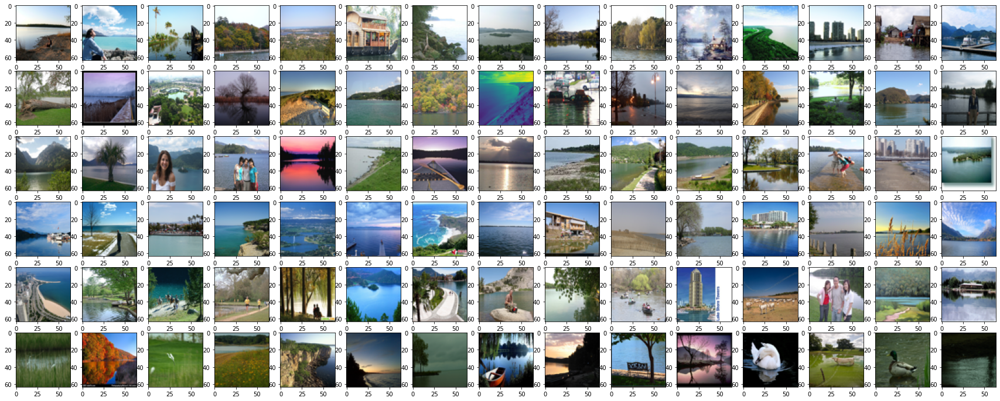

In [42]:
# visualize results
index = -2
category = list(output_dict.keys())[index]
displays_image_list(output_dict[category], print_number=NUM_CLUSTER, num_per_line=15)